# Reproducibility Study of “Studying How to Efficiently and Effectively Guide Models with Explanations”

Description: This file is part of a project aiming to reproduce the study titled "Studying How to Efficiently and 
Effectively Guide Models with Explanations." The project focuses on verifying the results and methodologies 
proposed in the original study, and potentially extending or refining the study's findings.

Based on the code of orginal paper: https://github.com/sukrutrao/Model-Guidance

### 1. Load the data

#### Download the ImageNet Model Weight

In [ ]:
import os
import subprocess

bcos_path = os.path.join(os.getcwd(), "weights/bcos/resnet_50-f46c1a4159.pth")

# Check if the xdnn directory exists and if the xfixup_resnet50_model_best.pth.tar exists
if not os.path.exists(bcos_path):

    # Check if the xdnn directory exists, create if it doesn't
    if not os.path.exists(os.path.join(os.getcwd(), "weights/xdnn")):
        os.makedirs(os.path.join(os.getcwd(), "weights/xdnn"))
        
    # Download the xfixup_resnet50_model_best.pth.tar
    subprocess.run(["wget", "-P", os.path.join(os.getcwd(), "weights/xdnn"), "https://download.visinf.tu-darmstadt.de/data/2021-neurips-fast-axiomatic-attribution/models/xfixup_resnet50_model_best.pth.tar"])

xdnn_path = os.path.join(os.getcwd(), "weights/xdnn/xfixup_resnet50_model_best.pth.tar")

# Check if the bcos directory exists and if the resnet_50-f46c1a4159.pth exists
if not os.path.exists("weights/bcos/resnet_50-f46c1a4159.pth"):

    # Check if the bcos directory exists, create if it doesn't
    if not os.path.exists(os.path.join(os.getcwd(), "weights/bcos")):
        os.makedirs(os.path.join(os.getcwd(), "weights/bcos"))

    # Download the resnet_50-f46c1a4159.pth
    subprocess.run(["wget", "-O", os.path.join(os.getcwd(), "weights/bcos/resnet_50-f46c1a4159.pth"), "https://nextcloud.mpi-klsb.mpg.de/index.php/s/3Yk6p86SBBFYSBN/download"])

#### For VOC2007

First, we load the data of VOC2007. The data is stored in the folder `datasets/VOC2007/`. The data is stored in the format of `.pt` file. We use the function `preprocess_voc2007.py` to load the data. Because this is run in a Jupyter Notebook, the `argspace` library is used to pass the arguments.

In [ ]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "train"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

In [ ]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "val"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

In [ ]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "test"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

We also load in the test set containing segmentations

In [11]:
import os
import argparse

from datasets.VOC2007.segment_preprocess import main as segment_procces

data_root = "datasets/VOC2007/"
split = "all"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path,
    "show_img": False,
    "img_amount": 0,
}
print(args)
# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}_segment.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:
    args = argparse.Namespace(**args)
    segment_procces(args)

{'data_root': 'datasets/VOC2007/', 'split': 'all', 'save_path': 'datasets/VOC2007/processed/', 'show_img': False, 'img_amount': 0}
Using downloaded and verified file: datasets/VOC2007/VOCtrainval_06-Nov-2007.tar
Extracting datasets/VOC2007/VOCtrainval_06-Nov-2007.tar to datasets/VOC2007/
Using downloaded and verified file: datasets/VOC2007/VOCtest_06-Nov-2007.tar
Extracting datasets/VOC2007/VOCtest_06-Nov-2007.tar to datasets/VOC2007/


100%|██████████| 423/423 [00:08<00:00, 47.52it/s]


saving 423 images


In [5]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "trainval"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

Using downloaded and verified file: datasets/VOC2007/VOCtrainval_06-Nov-2007.tar
Extracting datasets/VOC2007/VOCtrainval_06-Nov-2007.tar to datasets/VOC2007/


 45%|████▍     | 2252/5011 [00:05<00:06, 402.54it/s]

100%|██████████| 5011/5011 [00:12<00:00, 408.90it/s]


### For waterbirds

Secondly, we load the data of waterbirds. The data is stored in the folder `datasets/WATERBIRDS/`. The data is stored in the format of `.pt` file. We use the function `preprocess_waterbirds.py` to load the data. Because this is run in a Jupyter Notebook, the `argspace` library is used to pass the arguments.

In [ ]:
import argparse 
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "train"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

In [7]:
import argparse
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "val"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

100%|██████████| 1199/1199 [00:01<00:00, 917.96it/s]


Total num of images in set: 600


In [14]:
import argparse
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "test"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

Dataset test set already exists for WATERBIRDS dataset.


### 2. Train the baseline model

Train the baseline model using the training data for 2 epochs and a batch size of 16

#### For VOC2007

In [ ]:
import argparse

from train import main

model_backbone = "vanilla"
total_epochs = 2
learning_rate = 1e-4
log_path = "./base_logs_demo"
save_path = "./BASE_DEMO"
train_batch_size = 16
dataset = "VOC2007"

# Default values
seed = 0
model_path = None
data_path = "datasets/"
localization_loss_lambda = 1.0
layer = "Input"
localization_loss_fn = None
attribution_method = None
optimize_explanations = False
min_fscore = -1
pareto = False
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

#### For waterbirds

*Since Waterbird uses ImageNet pretrained weigths as a baseline model no code is needed to create a baseline model for waterbirds*

### 3. Train the fine-tuned model on the base model

For the fine-tuned model, due to computational resource limitation, we only train on 2 epochs and a batch size of 16.

#### For VOC2007:

In [10]:
import argparse

from train import main

model_backbone = "vanilla"
total_epochs = 2
learning_rate = 1e-4
log_path = "./finetune_logs_demo"
save_path = "./FT_DEMO"
train_batch_size = 16
dataset = "VOC2007"

model_path = "./BASE_DEMO/VOC2007/vanilla_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt"

# Default values
seed = 0
data_path = "datasets/"
localization_loss_lambda = 1e-3
layer = "Final"
localization_loss_fn = "Energy"
attribution_method = "IxG"
optimize_explanations = True
min_fscore = -1
pareto = True
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

Train data size: 2501
Annotated: 2501, Total: 2501


100%|██████████| 157/157 [00:09<00:00, 16.98it/s]


Epoch: 0, Average Loss: 0.05649153143167496


 50%|█████     | 1/2 [00:23<00:23, 23.60s/it]

Validation Metrics: {'Accuracy': 0.9692031741142273, 'Precision': 0.858669102191925, 'Recall': 0.7220225930213928, 'F-Score': 0.7844395041465759, 'True Positives': 2813.0, 'True Negatives': 45841.0, 'False Positives': 463.0, 'False Negatives': 1083.0, 'BB-Loc': 0.5035747002356983, 'BB-IoU': 0.34177729995454464, 'BB-IoU-Adapt': 0.14987902572827758, 'Average-Loss': 0.08885071895037039}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7844, EPG:0.5036, IOU:0.3418, MOD0)


100%|██████████| 157/157 [00:09<00:00, 16.98it/s]


Epoch: 1, Average Loss: 0.036696042865514755


100%|██████████| 2/2 [00:47<00:00, 23.59s/it]


Validation Metrics: {'Accuracy': 0.9670318961143494, 'Precision': 0.8250652551651001, 'Recall': 0.7299794554710388, 'F-Score': 0.7746152877807617, 'True Positives': 2844.0, 'True Negatives': 45701.0, 'False Positives': 603.0, 'False Negatives': 1052.0, 'BB-Loc': 0.4987831018531274, 'BB-IoU': 0.33403835582851793, 'BB-IoU-Adapt': 0.1473425040362842, 'Average-Loss': 0.09899205667564119}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7844, EPG:0.5036, IOU:0.3418, MOD0)


100%|██████████| 1238/1238 [00:27<00:00, 44.22it/s]


Validation Metrics: {'Accuracy': 0.9671041965484619, 'Precision': 0.8156754970550537, 'Recall': 0.740435004234314, 'F-Score': 0.7762362360954285, 'True Positives': 5651.0, 'True Negatives': 90131.0, 'False Positives': 1277.0, 'False Negatives': 1981.0, 'BB-Loc': 0.504817868893888, 'BB-IoU': 0.3427832099889947, 'BB-IoU-Adapt': 0.14897996237455374, 'Average-Loss': 0.09676851633099631}


100%|██████████| 1238/1238 [00:28<00:00, 44.07it/s]


Validation Metrics: {'Accuracy': 0.9695375561714172, 'Precision': 0.8574748039245605, 'Recall': 0.7252358198165894, 'F-Score': 0.7858309149742126, 'True Positives': 5535.0, 'True Negatives': 90488.0, 'False Positives': 920.0, 'False Negatives': 2097.0, 'BB-Loc': 0.5117164311099424, 'BB-IoU': 0.3462431759868287, 'BB-IoU-Adapt': 0.14692506334510733, 'Average-Loss': 0.08779482001826913}


#### For Waterbirds:

In [11]:
import argparse

from train import main

model_backbone = "bcos"
total_epochs = 2
learning_rate = 1e-5
log_path = "./base_logs_demo"
save_path = "./FT_DEMO"
train_batch_size = 16
dataset = "WATERBIRDS"

# Default values
seed = 0
model_path = None
data_path = "datasets/"
localization_loss_lambda = 1.0
layer = "Input"
localization_loss_fn = None
attribution_method = None
optimize_explanations = False
min_fscore = -1
pareto = False
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

Train data size: 4795
Annotated: 4795, Total: 4795


100%|██████████| 300/300 [00:40<00:00,  7.39it/s]


Epoch: 0, Average Loss: 1.5948412418365479


 50%|█████     | 1/2 [00:44<00:44, 44.09s/it]

Validation Metrics: {'Accuracy': 0.9066666960716248, 'Precision': 0.9221453070640564, 'Recall': 0.8883333206176758, 'F-Score': 0.9049236178398132, 'True Positives': 533.0, 'True Negatives': 555.0, 'False Positives': 45.0, 'False Negatives': 67.0, 'Average-Loss': 0.3295418039957682}


100%|██████████| 300/300 [00:40<00:00,  7.39it/s]


Epoch: 1, Average Loss: 0.17443053424358368


100%|██████████| 2/2 [01:28<00:00, 44.09s/it]


Validation Metrics: {'Accuracy': 0.9416666626930237, 'Precision': 0.966549277305603, 'Recall': 0.9150000214576721, 'F-Score': 0.9400684833526611, 'True Positives': 549.0, 'True Negatives': 581.0, 'False Positives': 19.0, 'False Negatives': 51.0, 'Average-Loss': 0.14746757507324218}


100%|██████████| 1449/1449 [00:32<00:00, 44.51it/s]


Validation Metrics: {'Accuracy': 0.6523990631103516, 'Precision': 0.675896406173706, 'Recall': 0.585605800151825, 'F-Score': 0.6275199055671692, 'True Positives': 3393.0, 'True Negatives': 4167.0, 'False Positives': 1627.0, 'False Negatives': 2401.0, 'Average-Loss': 1.1181466178643855}


100%|██████████| 1449/1449 [00:32<00:00, 44.89it/s]


Validation Metrics: {'Accuracy': 0.6523990631103516, 'Precision': 0.675896406173706, 'Recall': 0.585605800151825, 'F-Score': 0.6275199055671692, 'True Positives': 3393.0, 'True Negatives': 4167.0, 'False Positives': 1627.0, 'False Negatives': 2401.0, 'Average-Loss': 1.1181466178643855}


### 4. Evaluate the fine-tuned model on the test set

Evaluate the fine-tuned model on the test set and save the results.

#### For VOC2007:

In [12]:
from eval import evaluation_function

model_path = './FT_DEMO/VOC2007/vanilla_finetunedobjlocpareto_attrIxG_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.001_layerFinal/model_checkpoint_f1_best.pt'

split = 'test'

mode = 'bbs'

dataset = 'VOC2007'

# Create kwargs for evaluation function
args = {'model_path': model_path,
        'split': split,
        'mode': mode,
        'dataset': dataset}

# Evaluate
evaluation_function(**args)

Found model with specs:  vanilla Energy Final IxG VOC2007


100%|██████████| 1238/1238 [00:28<00:00, 43.49it/s]


Validation Metrics: {'Accuracy': 0.9695375561714172, 'Precision': 0.8574748039245605, 'Recall': 0.7252358198165894, 'F-Score': 0.7858309149742126, 'True Positives': 5535.0, 'True Negatives': 90488.0, 'False Positives': 920.0, 'False Negatives': 2097.0, 'BB-Loc': 0.5117164311099424, 'BB-IoU': 0.3462431759868287, 'BB-IoU-Adapt': 0.14692506334510733, 'Average-Loss': 0.08779482001826913}


{'Accuracy': 0.9695375561714172,
 'Precision': 0.8574748039245605,
 'Recall': 0.7252358198165894,
 'F-Score': 0.7858309149742126,
 'True Positives': 5535.0,
 'True Negatives': 90488.0,
 'False Positives': 920.0,
 'False Negatives': 2097.0,
 'BB-Loc': 0.5117164311099424,
 'BB-IoU': 0.3462431759868287,
 'BB-IoU-Adapt': 0.14692506334510733,
 'Average-Loss': 0.08779482001826913}

Evaluate on the segmentation dataset, here we also show that we are able to save the evaluation to a .npz file stored in the folder ./example_npz

In [16]:
from eval import evaluation_function

model_path = './FT_DEMO/VOC2007/vanilla_finetunedobjlocpareto_attrIxG_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.001_layerFinal/model_checkpoint_f1_best.pt'

split = 'seg_test'

mode = 'segment'

dataset = 'VOC2007'

# Create kwargs for evaluation function
args = {'model_path': model_path,
        'split': split,
        'mode': mode,
        'dataset': dataset,
        "npz": True,
        "save_npz_path": "./example_npz"}

# Evaluate
evaluation_function(**args)

Found model with specs:  vanilla Energy Final IxG VOC2007


100%|██████████| 106/106 [00:02<00:00, 38.70it/s]

Validation Metrics: {'Accuracy': 0.9639480113983154, 'Precision': 0.8666666746139526, 'Recall': 0.667617678642273, 'F-Score': 0.7542304396629333, 'True Positives': 468.0, 'True Negatives': 7687.0, 'False Positives': 72.0, 'False Negatives': 233.0, 'BB-Loc': 0.47081565370423906, 'BB-IoU': 0.31972083145247365, 'BB-IoU-Adapt': 0.15111636314288673, 'BB-Loc-segment': 0.2893616464338805, 'BB-Loc-Fraction': 0.5079965069624309, 'Average-Loss': 0.10390558986799091}


{'Accuracy': 0.9639480113983154,
 'Precision': 0.8666666746139526,
 'Recall': 0.667617678642273,
 'F-Score': 0.7542304396629333,
 'True Positives': 468.0,
 'True Negatives': 7687.0,
 'False Positives': 72.0,
 'False Negatives': 233.0,
 'BB-Loc': 0.47081565370423906,
 'BB-IoU': 0.31972083145247365,
 'BB-IoU-Adapt': 0.15111636314288673,
 'BB-Loc-segment': 0.2893616464338805,
 'BB-Loc-Fraction': 0.5079965069624309,
 'Average-Loss': 0.10390558986799091}

#### For Waterbirds:

In [13]:
from eval import evaluation_function

model_path = './FT_DEMO/WATERBIRDS/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr1e-05_sll1.0_layerInput/model_checkpoint_f1_best.pt'

split = 'test'

mode = 'bbs'

dataset = 'WATERBIRDS'

# Create kwargs for evaluation function
args = {'model_path': model_path,
        'split': split,
        'mode': mode,
        'dataset': dataset}

# Evaluate
evaluation_function(**args)

Found model with specs:  bcos Energy Input BCos WATERBIRDS


100%|██████████| 1449/1449 [01:29<00:00, 16.28it/s]


Validation Metrics: {'Accuracy': 0.6523990631103516, 'Precision': 0.675896406173706, 'Recall': 0.585605800151825, 'F-Score': 0.6275199055671692, 'True Positives': 3393.0, 'True Negatives': 4167.0, 'False Positives': 1627.0, 'False Negatives': 2401.0, 'BB-Loc': 0.46992257655420444, 'BB-IoU': 0.0015712075513709116, 'BB-IoU-Adapt': 0.1746796921318039, 'Average-Loss': 1.1181466178643855}


{'Accuracy': 0.6523990631103516,
 'Precision': 0.675896406173706,
 'Recall': 0.585605800151825,
 'F-Score': 0.6275199055671692,
 'True Positives': 3393.0,
 'True Negatives': 4167.0,
 'False Positives': 1627.0,
 'False Negatives': 2401.0,
 'BB-Loc': 0.46992257655420444,
 'BB-IoU': 0.0015712075513709116,
 'BB-IoU-Adapt': 0.1746796921318039,
 'Average-Loss': 1.1181466178643855}

### 5. Visualize the different attribution methods

Visualize the different attribution methods on the test set. Due to computational resource limitation, we load the best model checkpoints.

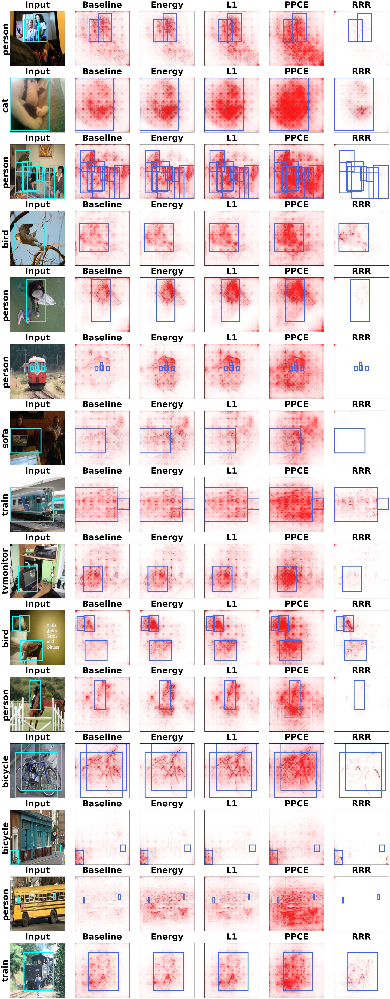

In [14]:
import torch
torch.cuda.empty_cache()

from visualize import visualize_fig9

visualize_fig9(
    [
        "BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.01_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossPPCE_origmodel_checkpoint_f1_best.pt_resnet50_lr0.001_sll0.001_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossRRR_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll5e-05_layerInput/model_checkpoint_f1_best.pt",
    ],
    last=False
)

### 6. Visualize the model with dilated bounding boxes

To demonstrate the effect of dilated bounding boxes, we visualize the model with dilated bounding boxes. Due to computational resource limitation, we load in the pre-trained model and visualize the model with dilated bounding boxes.

BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_FT_dilated_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt
FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_FT_dilated_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt


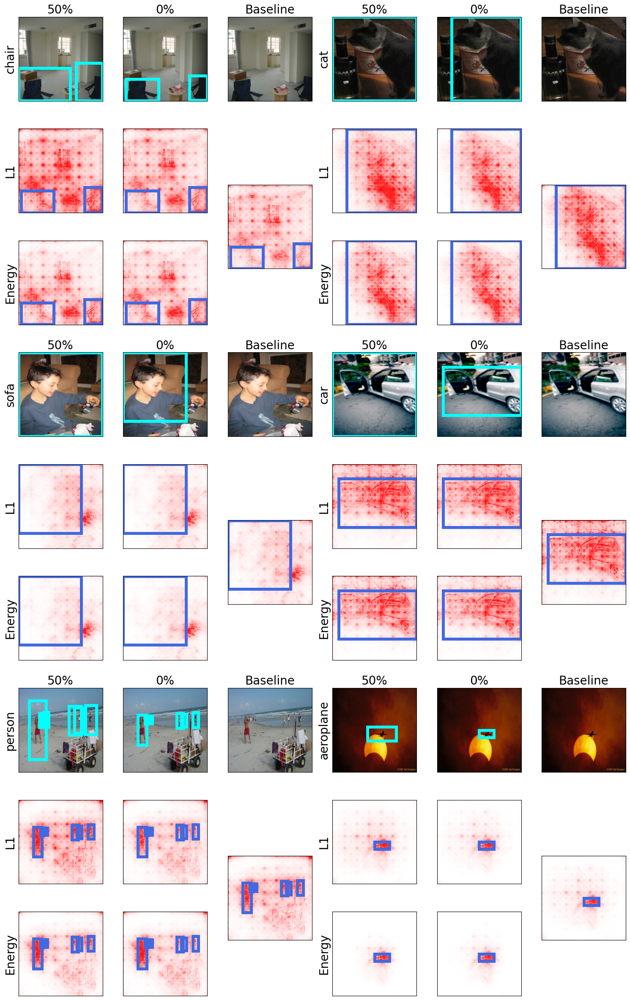

In [15]:
import torch
torch.cuda.empty_cache()

from visualize import visualize_fig11

visualize_fig11(
    base_path="BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt",
    energy_paths=[
        "FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/DIL/bcos_FT_dilated_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt",
    ],
    L1_paths=[
        "FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/DIL/bcos_FT_dilated_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt",
    ],
    last=False
    )

### 7. Show that the Pareto Front works

To show that the Pareto Front works, we need to evaluate the model on the test set and calculate the Pareto Front. But due to computational resource limitation, we selected 6 model checkpoints from the fine-tuned model (see the given path) and evaluate them on the test set.

In [16]:
from pareto_FT import pareto_demo

bin_width=0.005,
layer="Final"
data_split="test"
attribution_method="BCos"
eval_batch_size=4
model_dir="./FT/VOC2007/bcos/fin/l1/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerFinal/pareto_front"
output_dir="./p_curves_demo/VOC2007/bcos/Final/L1"

pareto_demo(
    bin_width=bin_width,
    layer=layer,
    data_split=data_split,
    attribution_method=attribution_method,
    eval_batch_size=eval_batch_size,
    model_dir=model_dir,
    output_dir=output_dir
)

100%|██████████| 1238/1238 [00:48<00:00, 25.39it/s]


Validation Metrics: {'Accuracy': 0.9715165495872498, 'Precision': 0.8774517774581909, 'Recall': 0.7327044010162354, 'F-Score': 0.7985719442367554, 'True Positives': 5592.0, 'True Negatives': 90627.0, 'False Positives': 781.0, 'False Negatives': 2040.0, 'BB-Loc': 0.6188596601731691, 'BB-IoU': 0.262054114084956, 'BB-IoU-Adapt': 0.18594447452860208, 'Average-Loss': 0.10765420793524082}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)


100%|██████████| 1238/1238 [00:50<00:00, 24.70it/s]


Validation Metrics: {'Accuracy': 0.9715367555618286, 'Precision': 0.880474328994751, 'Recall': 0.7296907901763916, 'F-Score': 0.7980225086212158, 'True Positives': 5569.0, 'True Negatives': 90652.0, 'False Positives': 756.0, 'False Negatives': 2063.0, 'BB-Loc': 0.5783531045843895, 'BB-IoU': 0.2896006418738362, 'BB-IoU-Adapt': 0.1934903742917194, 'Average-Loss': 0.09790644853681278}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)


100%|██████████| 1238/1238 [00:50<00:00, 24.47it/s]


Validation Metrics: {'Accuracy': 0.9707087874412537, 'Precision': 0.8621956706047058, 'Recall': 0.7378144860267639, 'F-Score': 0.7951704859733582, 'True Positives': 5631.0, 'True Negatives': 90508.0, 'False Positives': 900.0, 'False Negatives': 2001.0, 'BB-Loc': 0.674812879768999, 'BB-IoU': 0.2097804279722185, 'BB-IoU-Adapt': 0.1620789793126028, 'Average-Loss': 0.13163783207463525}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


100%|██████████| 1238/1238 [00:50<00:00, 24.52it/s]


Validation Metrics: {'Accuracy': 0.971031904220581, 'Precision': 0.8752166628837585, 'Recall': 0.7278563976287842, 'F-Score': 0.7947635650634766, 'True Positives': 5555.0, 'True Negatives': 90616.0, 'False Positives': 792.0, 'False Negatives': 2077.0, 'BB-Loc': 0.6457770038315369, 'BB-IoU': 0.23786510146682394, 'BB-IoU-Adapt': 0.1745602715453735, 'Average-Loss': 0.11449188331024712}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


100%|██████████| 1238/1238 [00:50<00:00, 24.47it/s]


Validation Metrics: {'Accuracy': 0.9719507098197937, 'Precision': 0.8793373107910156, 'Recall': 0.7371593117713928, 'F-Score': 0.8019956946372986, 'True Positives': 5626.0, 'True Negatives': 90636.0, 'False Positives': 772.0, 'False Negatives': 2006.0, 'BB-Loc': 0.6109908760856303, 'BB-IoU': 0.4375153568764916, 'BB-IoU-Adapt': 0.19539064088592212, 'Average-Loss': 0.12509782633989425}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


100%|██████████| 1238/1238 [00:50<00:00, 24.45it/s]


Validation Metrics: {'Accuracy': 0.9713247418403625, 'Precision': 0.8705536723136902, 'Recall': 0.7375524044036865, 'F-Score': 0.7985529899597168, 'True Positives': 5629.0, 'True Negatives': 90571.0, 'False Positives': 837.0, 'False Negatives': 2003.0, 'BB-Loc': 0.5366813552549434, 'BB-IoU': 0.3190338866409736, 'BB-IoU-Adapt': 0.19464724043193327, 'Average-Loss': 0.09062178184989966}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


The results are shown in the following figure. We can see the distinction between the Pareto Front and the non-Pareto Front.

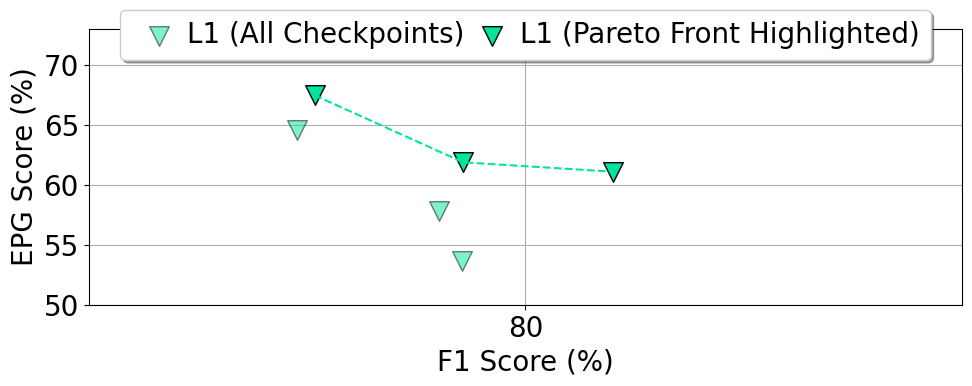

In [17]:
from utils import *
from visualize import *

root_folder = './p_curves_demo/VOC2007/bcos/Final/L1/pareto'
data_f1_epg_pareto = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

root_folder = './p_curves_demo/VOC2007/bcos/Final/L1/not_pareto'
data_f1_epg_not_pareto = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

plot_pareto_curve(
    baseline_data=data_f1_epg_pareto['vanilla']['input']['baseline'],
    l1_data=data_f1_epg_pareto['bcos']['final']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=(79, 81),
    set_ylim=(50, 73),
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG",
    plot_demo_data=True,
    demo_data=data_f1_epg_not_pareto['bcos']['final']['l1'])

### 8. Show the results from the additional experiment (fairness.py), which looks at each class individually and downloads a .csv file with the results.

In [18]:
import argparse

model_pathBase = "./BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt"
model_pathFN50 = "./FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_final_50.pt"
model_pathFNbest = "./FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt"
dataset = "VOC2007"
split = "test"
metric = "BB-Loc"

from fairness import main

args = {
    "model_pathBase": model_pathBase,
    "model_pathFN50": model_pathFN50,
    "model_pathFNbest": model_pathFNbest,
    "dataset": dataset,
    "split": split,
    "metric": metric
}

args = argparse.Namespace(**args)

main(args)

Found model with specs:  bcos Energy Final BCos VOC2007


100%|██████████| 1238/1238 [00:50<00:00, 24.57it/s]


Found model with specs:  bcos Energy Final BCos VOC2007


 21%|██        | 258/1238 [00:10<00:41, 23.75it/s]

100%|██████████| 1238/1238 [00:50<00:00, 24.74it/s]


Found model with specs:  bcos Energy Final BCos VOC2007


100%|██████████| 1238/1238 [00:50<00:00, 24.62it/s]


Visualize the results from the additional experiment in a dataframe. Due to computational resource limitation, we load in the pre-trained model and show the results from the additional experiment.

In [19]:
import pandas as pd

pd.read_csv("VOC2007_BB-Loc_test.csv")

,class-name,num-samples,bl-means,ft50-means,percentage50_diff,ftbest-means,percentagebest_diff
0,aeroplane,tensor(205),57.7,66.3,14.9,61.3,6.2
1,bicycle,tensor(250),55.4,66.8,20.6,59.4,7.2
2,bird,tensor(289),42.8,63.4,48.2,50.5,18.0
3,boat,tensor(176),42.2,55.8,32.4,45.9,8.8
4,bottle,tensor(240),16.9,24.5,44.9,18.0,6.6
5,bus,tensor(183),59.9,73.9,23.4,63.8,6.7
6,car,tensor(775),48.8,62.3,27.6,53.7,9.9
7,cat,tensor(332),65.9,79.0,20.0,70.0,6.3
8,chair,tensor(545),25.6,41.8,63.1,28.9,12.6
9,cow,tensor(127),54.6,69.1,26.7,60.0,10.0


### 9. Show the evaluation results of the fine-tuned model (Pareto front)

In this section, we show the evaluation results of the fine-tuned model (Pareto front) on the test set. Because of computational resource limitation, we saved the evaluation results in .npz files. The evaluation results are loaded from the .npz files  with the ```load_data_from_folders_with_npz_files``` function in ```utils.py``` and visualized with the ```plot_pareto_curve``` function in ```visualize.py```.

*The plots for figure 1 from our reproducibility study are shown below.*

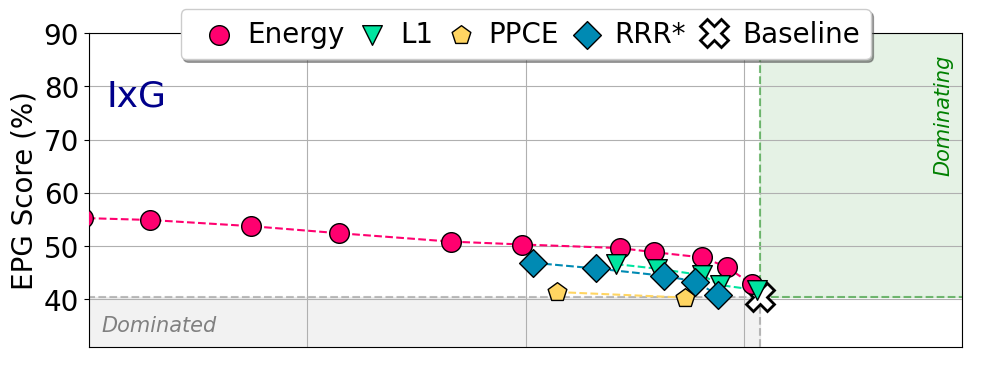

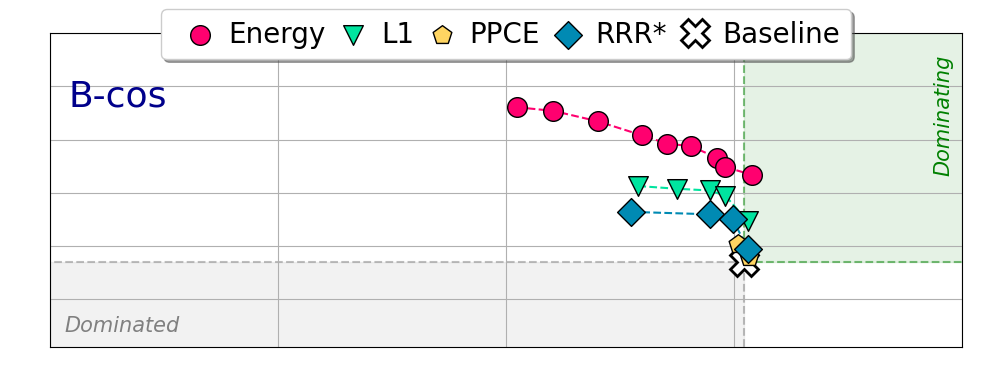

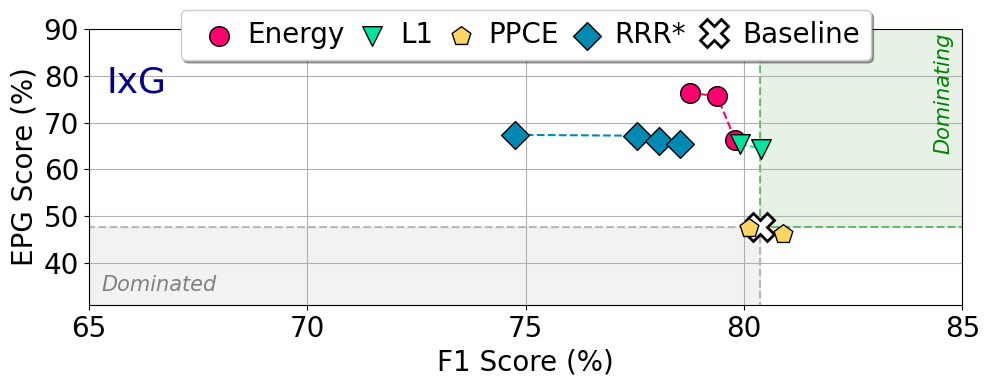

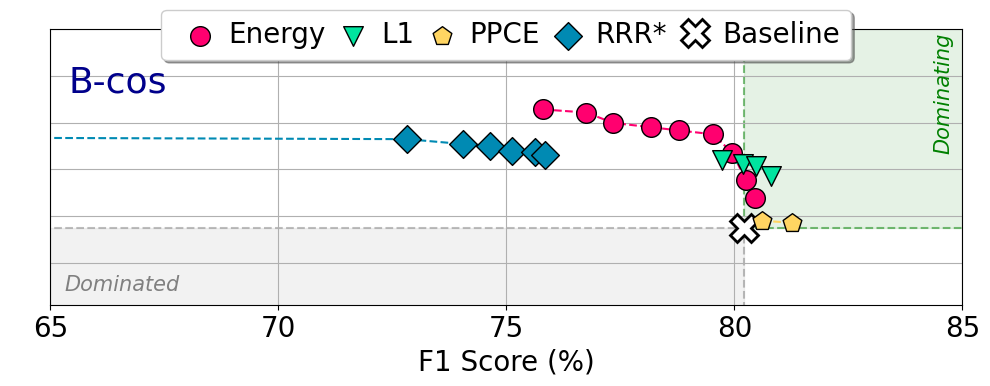

In [20]:
from utils import *
from visualize import *

root_folder = './p_curves/VOC2007'
data_f1_epg = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (65, 85)
y_lim_range = (31, 90)
step_size_xticks = 5
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_f1_epg['vanilla']['input']['baseline'],
    energy_data=data_f1_epg['vanilla']['input']['energy'],
    l1_data=data_f1_epg['vanilla']['input']['l1'],
    ppce_data=data_f1_epg['vanilla']['input']['ppce'],
    rrr_data=data_f1_epg['vanilla']['input']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_epg['bcos']['input']['baseline'],
    energy_data=data_f1_epg['bcos']['input']['energy'],
    l1_data=data_f1_epg['bcos']['input']['l1'],
    ppce_data=data_f1_epg['bcos']['input']['ppce'],
    rrr_data=data_f1_epg['bcos']['input']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

plot_pareto_curve(
    baseline_data=data_f1_epg['vanilla']['final']['baseline'],
    energy_data=data_f1_epg['vanilla']['final']['energy'],
    l1_data=data_f1_epg['vanilla']['final']['l1'],
    ppce_data=data_f1_epg['vanilla']['final']['ppce'],
    rrr_data=data_f1_epg['vanilla']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_epg['bcos']['final']['baseline'],
    energy_data=data_f1_epg['bcos']['final']['energy'],
    l1_data=data_f1_epg['bcos']['final']['l1'],
    ppce_data=data_f1_epg['bcos']['final']['ppce'],
    rrr_data=data_f1_epg['bcos']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=(step_size_yticks),
    hide_x_ticks=False,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

*The plots for figure 2 from our reproducibility study are shown below.*

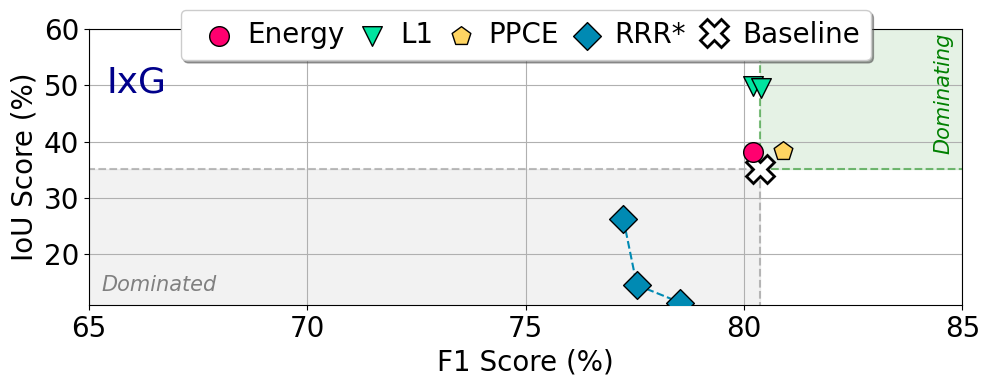

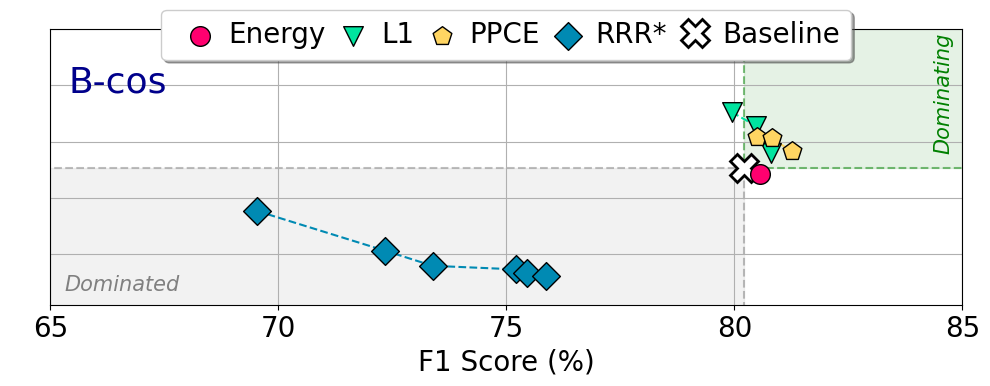

In [21]:
from utils import *
from visualize import *

root_folder = './p_curves/VOC2007'
data_f1_iou = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'iou_score'))

x_lim_range = (65, 85)
y_lim_range = (11, 60)
step_size_xticks = 5
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_f1_iou['vanilla']['final']['baseline'],
    energy_data=data_f1_iou['vanilla']['final']['energy'],
    l1_data=data_f1_iou['vanilla']['final']['l1'],
    ppce_data=data_f1_iou['vanilla']['final']['ppce'],
    rrr_data=data_f1_iou['vanilla']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='IoU Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_iou['bcos']['final']['baseline'],
    energy_data=data_f1_iou['bcos']['final']['energy'],
    l1_data=data_f1_iou['bcos']['final']['l1'],
    ppce_data=data_f1_iou['bcos']['final']['ppce'],
    rrr_data=data_f1_iou['bcos']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='IoU Score (%)',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

*The plots for figure 4 from our reproducibility study are shown below.*

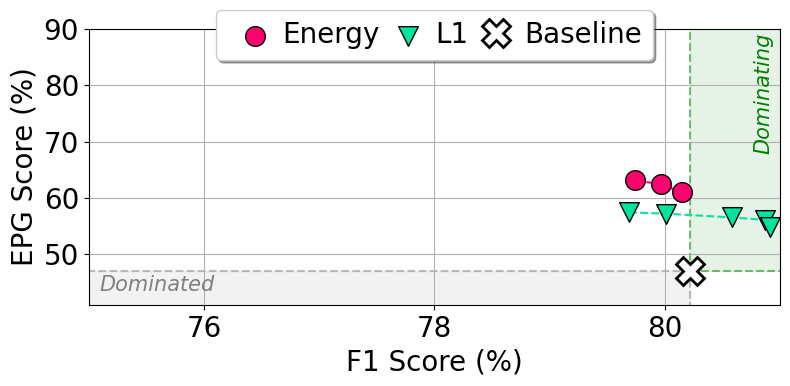

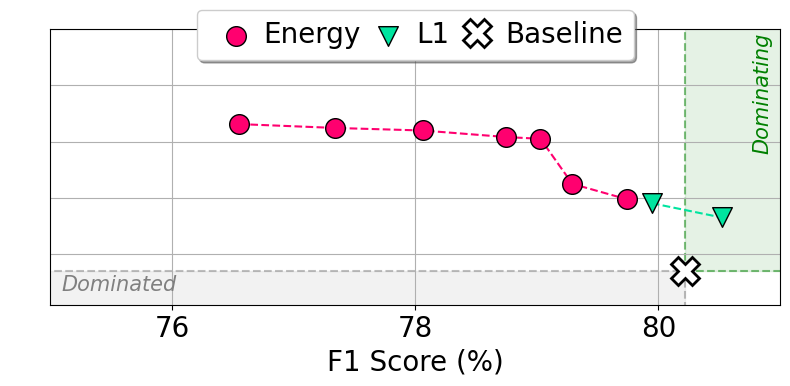

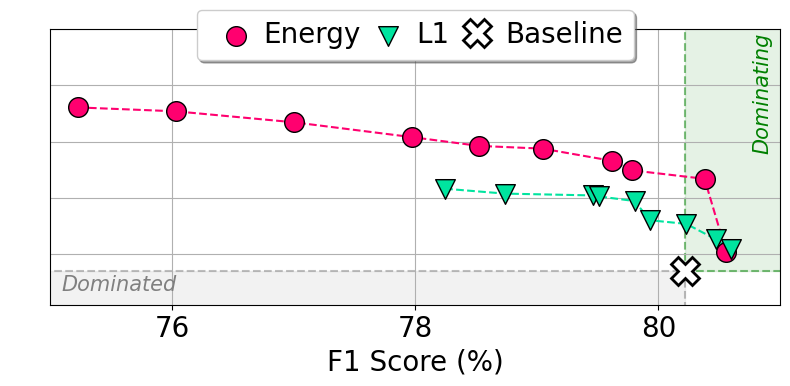

In [22]:
from utils import *
from visualize import *

root_folder = './p_c_ann'
data_limited_ann_f1_epg = utils.load_data_from_folders_with_npz_files_with_limited_ann(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (75, 81)
y_lim_range = (41, 90)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim0.01']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim0.01']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim0.01']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="")

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim0.1']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim0.1']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim0.1']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="")

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim1.0']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim1.0']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim1.0']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="")

*The plots for figure 5 from our reproducibility study are shown below.*

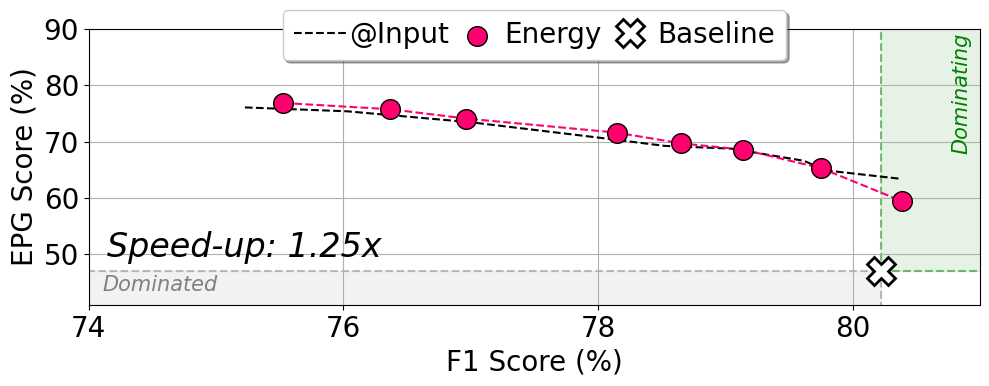

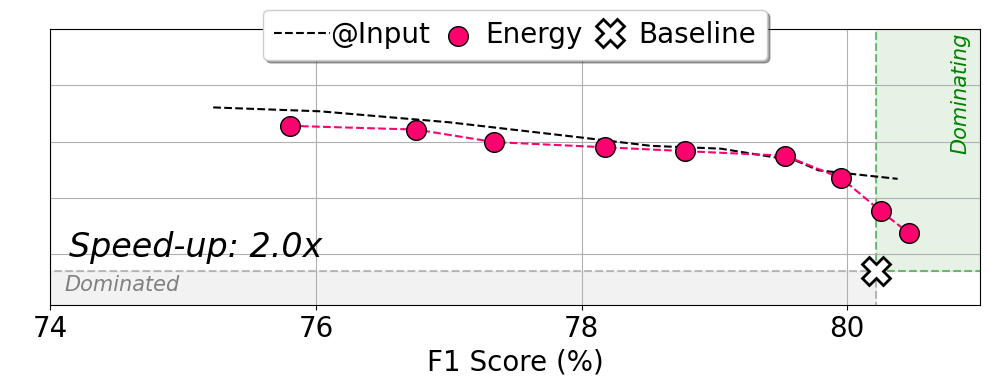

In [23]:
from utils import *
from visualize import *    

root_folder = './p_curves/VOC2007'
data_speed_up_f1_epg = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (74, 81)
y_lim_range = (41, 90)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_speed_up(
    baseline_data=data_speed_up_f1_epg['bcos']['input']['baseline'],
    energy_data_input_layer=data_speed_up_f1_epg['bcos']['input']['energy'],
    energy_data=data_speed_up_f1_epg['bcos']['mid2']['energy'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    speed_up_text='Speed-up: 1.25x',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_speed_up(
    baseline_data=data_speed_up_f1_epg['bcos']['input']['baseline'],
    energy_data_input_layer=data_speed_up_f1_epg['bcos']['input']['energy'],
    energy_data=data_speed_up_f1_epg['bcos']['final']['energy'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    speed_up_text='Speed-up: 2.0x',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20)

*The plots for figure 6 from our reproducibility study are shown below.*

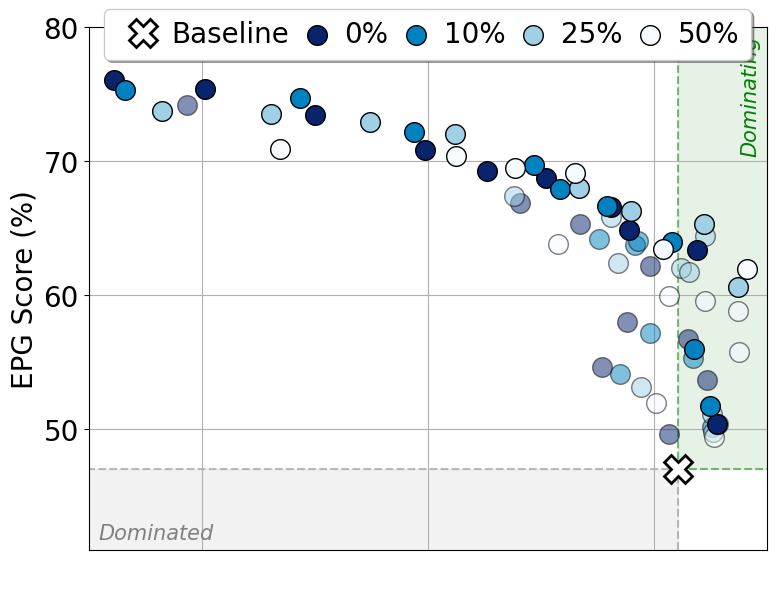

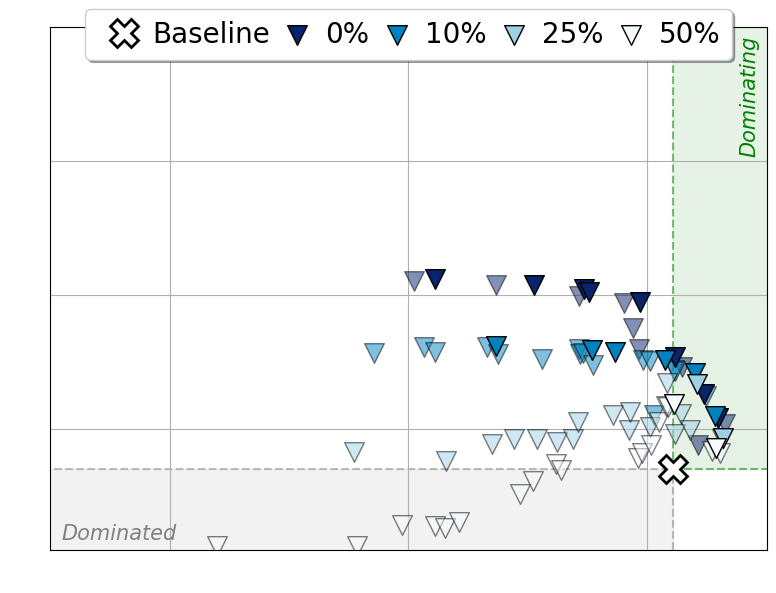

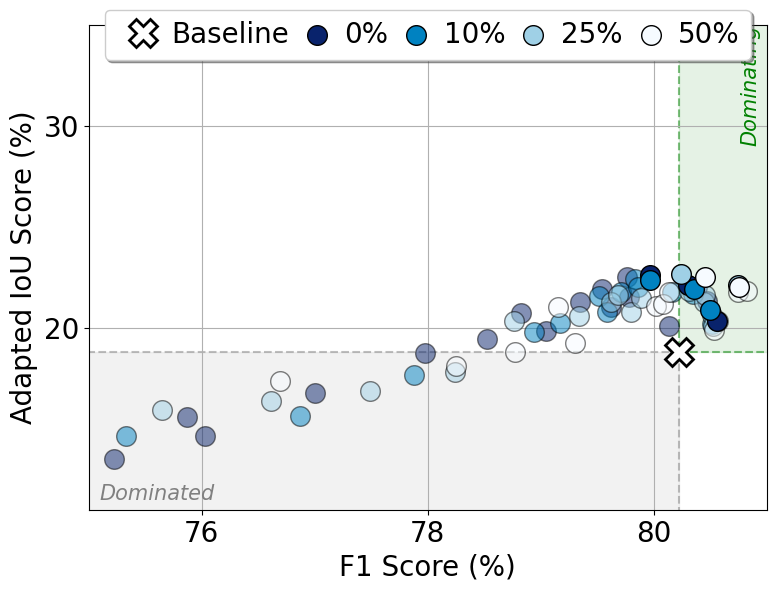

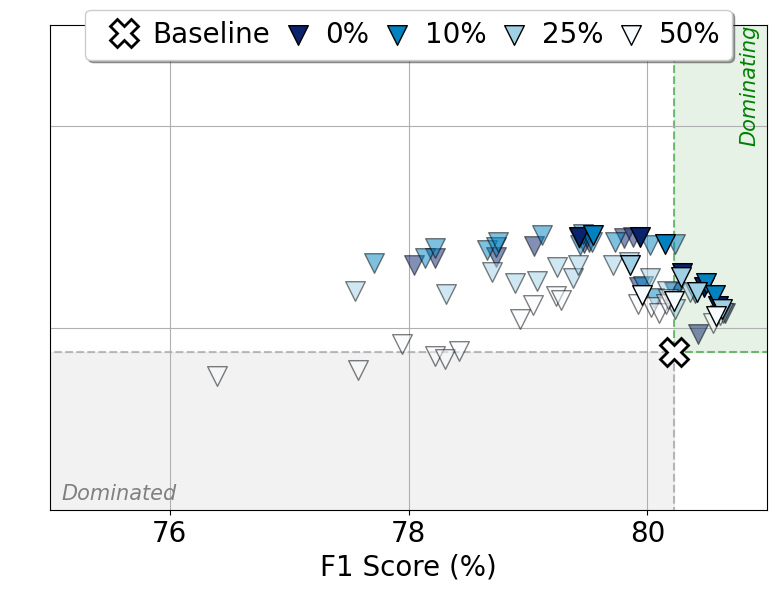

In [24]:
from utils import *
from visualize import *    

root_folder = './p_c_dil'
data_dilation_f1_epg = utils.load_data_from_folders_with_npz_files_with_dilation(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (75, 81)
y_lim_range = (41, 80)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['energy'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['energy'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['energy'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['energy'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['energy'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['energy'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['energy'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['energy'],
    loss='Energy',
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_energy_f1_epg_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['l1'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['l1'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['l1'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['l1'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['l1'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['l1'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['l1'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['l1'],
    loss='L1',
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_l1_f1_epg_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=True,
    fontsize=20)

root_folder = './p_c_dil'
data_dilation_f1_epg = utils.load_data_from_folders_with_npz_files_with_dilation(root_folder, metrics=('f_score', 'adapt_iou_score'))

x_lim_range = (75, 81)
y_lim_range = (11, 35)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['energy'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['energy'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['energy'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['energy'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['energy'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['energy'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['energy'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['energy'],
    loss='Energy',
    x_label='F1 Score (%)',
    y_label='Adapted IoU Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_energy_f1_adapt_iou_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['l1'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['l1'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['l1'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['l1'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['l1'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['l1'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['l1'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['l1'],
    loss='L1',
    x_label='F1 Score (%)',
    y_label='Adapted IoU Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_l1_f1_adapt_iou_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=True,
    fontsize=20)